In [1]:
import torch
from PIL import Image
import os
import numpy as np
import ptp_utils
sdxl = False
gpu_num = 0
device = torch.device(f"cuda:{gpu_num}") if torch.cuda.is_available() else "cpu"

# Define heads perturbed
if not sdxl:
    heads_perturbed = [0, 1, 11, 21, 31, 41, 51, 61, 71, 128]
else:
    heads_perturbed = [0, 11, 111, 211, 311, 411, 511, 611, 711, 1300]

# Define the classes
Color = "red, blue, green, yellow, black, white, purple, gray, pink, brown".split(", ")
Animals = "cat, dog, rabbit, frog, bird, squirrel, deer, lion, penguin, horse".split(", ")
Fruits_and_Vegetables = "lemons, bananas, apples, oranges, blueberries, carrots, broccoli, tomatoes, potatoes, grapes".split(", ")
Image_Style = "cubist, pop art, steampunk, impressionist, black-and-white, watercolor, cartoon, minimalist, sepia, sketch".split(", ")
Material = "glass, copper, marble, jade, gold, basalt, silver, clay, paper, leather".split(", ")
Nature_Scenes = "forest, desert, beach, waterfall, mountain, canyon, glacier, coral reef, jungle, lake".split(", ")
Weather_Conditions = "snowy, rainy, foggy, stormy".split(", ")
Geometric_Patterns = "polka-dot, leopard, stripe, greek-key, plaid".split(", ")
Furniture = "bed, table, chair, sofa, recliner, bookshelf, dresser, wardrobe, coffee table, TV stand".split(", ")
Objects_A = "car, bench, bowl, ballon, ball".split(", ")
Objects_B = "bowl, cup, table, ball, teapot".split(", ")
Objects_C = "T-shirt, pillow, wallpaper, umbrella, blanket".split(", ")
Animals_A = "cat, dog, rabbit, frog, bird".split(", ")
Others = "castle, mountain, cityscape, farmland, forest".split(", ")
Animals_ood = "rabbit, frog, sheep, pig, chicken, dolphin, goat, duck, deer, fox".split(", ")
Color_ood = "coral, beige, violet, cyan, magenta, indigo, orange, turquoise, teal, khaki".split(", ")
Material_ood = "copper, marble, jade, gold, basalt, silver, clay, steel, tin, bronze".split(", ")
Fruits_and_Vegetables_ood = "lemons, blueberries, onions, raspberries, pineapples, cherries, cucumbers, bell peppers, cauliflowers, mangoes".split(", ")
Nature_Scenes_ood = "glacier, coral reef, swamp, pond, fjord, rainforest, grassland, marsh, creek, island".split(", ")
Tableware = "salad bowl, serving platter, bread basket, fondue pot, spoon, fork, nut dish, coffee pot, tureen, chafing dish".split(",")

Concept: Image Style
Prompt: a cubist style painting of a castle
(Top) Weakening in MoRHF order: [0, 1, 11, 21, 31, 41, 51, 61, 71, 128]
(Bottom) Weakening in LeRHF order: [0, 1, 11, 21, 31, 41, 51, 61, 71, 128]

Seed: 20


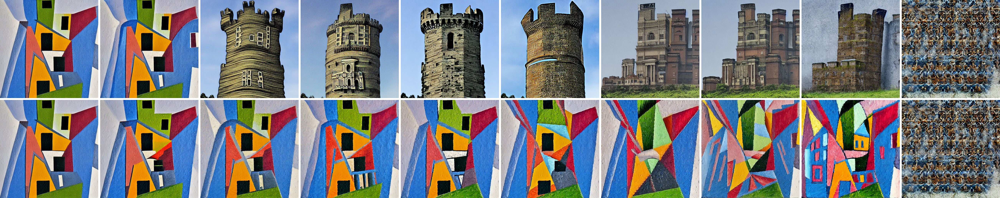

In [3]:
# Draw the images
seeds = [20]
exp_nums = [5]
concepts = ["Image Style"]
prompt_to_check_images = "a cubist style painting of a castle"

for idx, exp_num in enumerate(exp_nums):
    concept = concepts[idx]

    directory = f"./hp_outputs/exp_{exp_num}"
    subdirectories = [name for name in os.listdir(directory) if os.path.isdir(os.path.join(directory, name))]
    subdirectory = os.path.join(directory, prompt_to_check_images)
    print(f"Concept: {concept}")
    print(f"Prompt: {prompt_to_check_images}")
    print(f"(Top) Weakening in MoRHF order: {heads_perturbed}")
    print(f"(Bottom) Weakening in LeRHF order: {heads_perturbed}")
    print(f"")

    for seed in seeds:
        print(f"Seed: {seed}")
        images = []
        for order in ["top", "bottom"]:
            subdirectory_order = os.path.join(subdirectory, order)
            suborders = [f"{order}_{head}" for head in heads_perturbed]
            for suborder in suborders:
                image_path = os.path.join(subdirectory_order, suborder, f"{seed}.png")
                images.append(np.expand_dims(np.array(Image.open(image_path)), axis=0))
        images = np.concatenate(images, axis=0)    
        ptp_utils.view_images(images, num_rows=2)